In [1]:
import sys
sys.path.append('/Users/koush/Projects/Banksy_py')
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [4]:
from banksy_utils.load_data import load_adata, display_adata
import scanpy as sc
import numpy as np

In [5]:
data_dir = '/Users/koush/Downloads/SlideTagsMelanoma/SCP2171'
adata = sc.read_csv(f'{data_dir}/expression/HumanMelanomaRNA_expression.csv.gz').T
spatial_df = pd.read_csv(f'{data_dir}/cluster/HumanMelanomaRNA_spatial.csv')
adata.obs = adata.obs.join(spatial_df.set_index('NAME'))
adata.obsm['spatial'] = adata.obs[['X', 'Y']].values.astype(np.float64)

In [6]:
raw_x, raw_y = adata.obsm['spatial'][:, 0], adata.obsm['spatial'][:, 1]

In [7]:
# display_adata(adata)

In [8]:
from banksy.main import median_dist_to_nearest_neighbour

In [9]:
plot_graph_weights = True
k_geom = 15 # number of spatial neighbours
max_m = 1 # use both mean and AFT
nbr_weight_decay = "scaled_gaussian" # can also choose "reciprocal", "uniform" or "ranked"

# Find median distance to closest neighbours
nbrs = median_dist_to_nearest_neighbour(adata, key = 'spatial')


Median distance to closest cell = 14.11888799398016

---- Ran median_dist_to_nearest_neighbour in 0.01 s ----



In [18]:
adata.obs['x'] = raw_x
adata.obs['y'] = raw_y


Median distance to closest cell = 14.11888799398016

---- Ran median_dist_to_nearest_neighbour in 0.01 s ----

---- Ran generate_spatial_distance_graph in 0.02 s ----

---- Ran row_normalize in 0.01 s ----

---- Ran generate_spatial_weights_fixed_nbrs in 0.08 s ----

----- Plotting Edge Histograms for m = 0 -----

Edge weights (distances between cells): median = 48.014802473831054, mode = 44.16894018015849

---- Ran plot_edge_histogram in 0.02 s ----


Edge weights (weights between cells): median = 0.05749620659283604, mode = 0.03770004992378311

---- Ran plot_edge_histogram in 0.02 s ----

---- Ran generate_spatial_distance_graph in 0.03 s ----

---- Ran theta_from_spatial_graph in 0.02 s ----

---- Ran row_normalize in 0.01 s ----

---- Ran generate_spatial_weights_fixed_nbrs in 0.10 s ----

----- Plotting Edge Histograms for m = 1 -----

Edge weights (distances between cells): median = 68.98206344382734, mode = 72.36133000233058

---- Ran plot_edge_histogram in 0.02 s ----


Edge w

/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/cbook.py:1762: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/numpy/lib/histograms.py:841: ComplexWarning: Casting complex values to real discards the imaginary part
  indices = f_indices.astype(np.intp)
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/axes/_axes.py:7004: ComplexWarning: Casting complex values to real discards the imaginary part
  bins = np.array(bins, float)  # causes problems if float16
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/cbook.py:1398: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


Maximum weight: 0.20925474894726429

---- Ran plot_graph_weights in 0.33 s ----

Maximum weight: (0.08979214774881071-0.026550383411315326j)

---- Ran plot_graph_weights in 0.73 s ----

----- Plotting theta Graph -----


/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/collections.py:426: ComplexWarning: Casting complex values to real discards the imaginary part
  renderer.draw_path_collection(


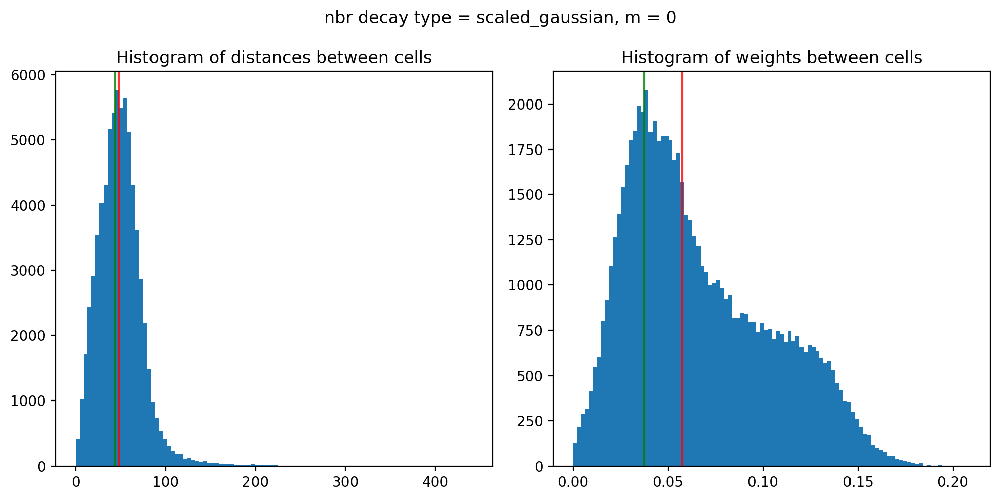

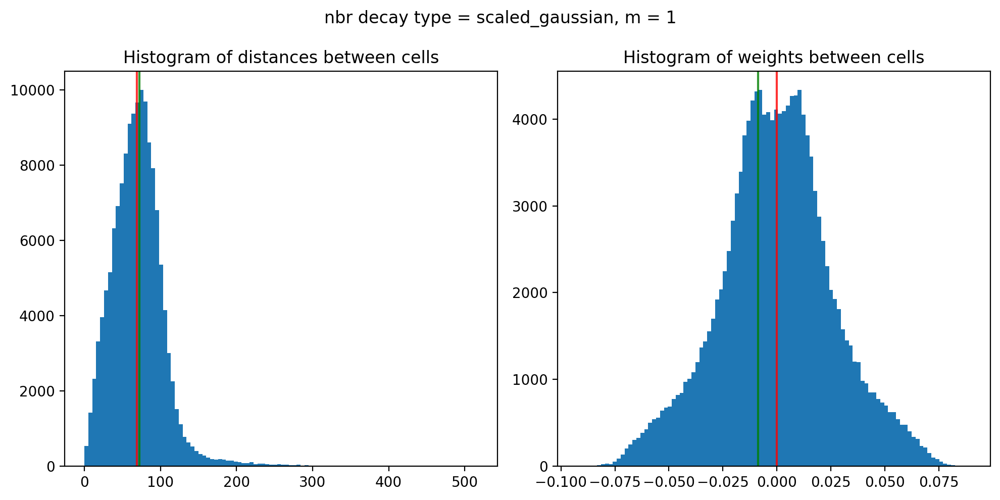

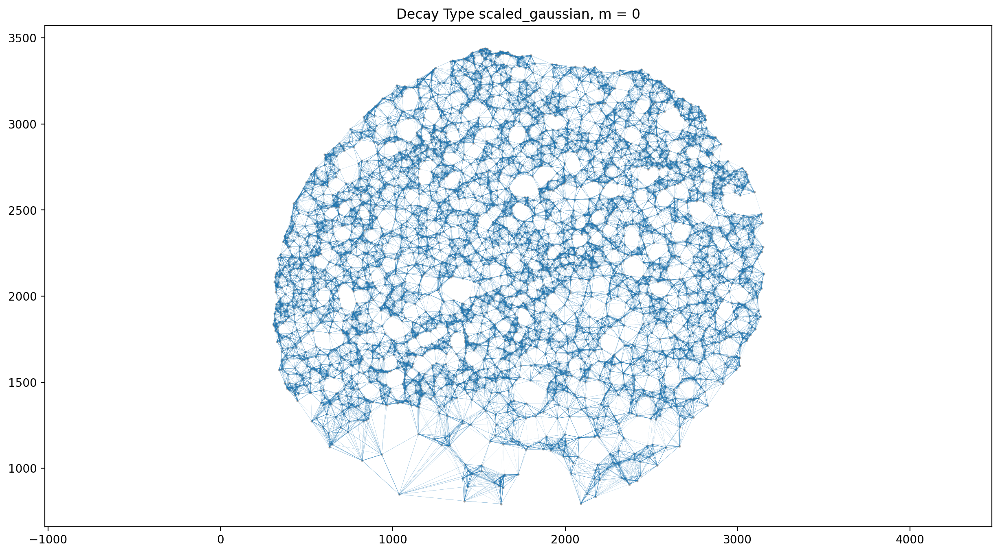

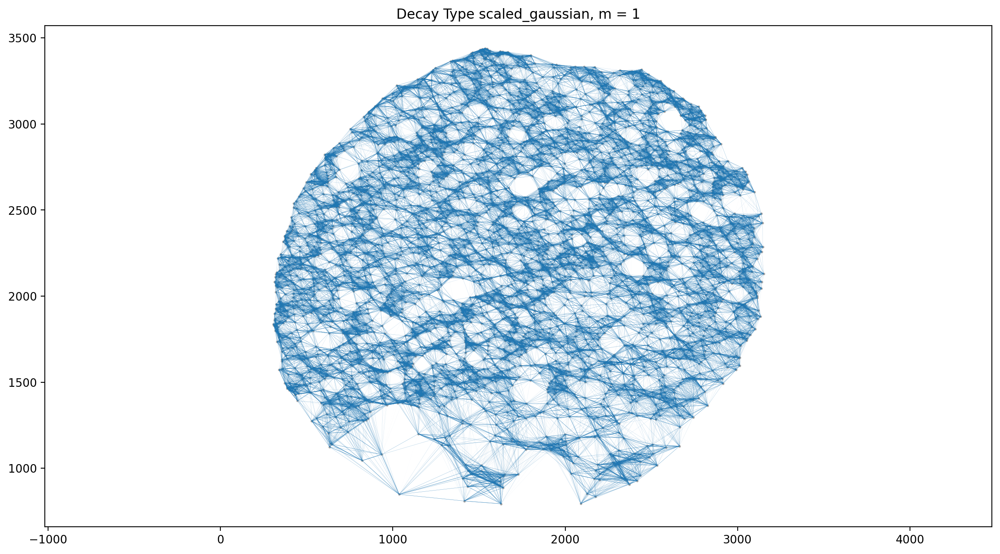

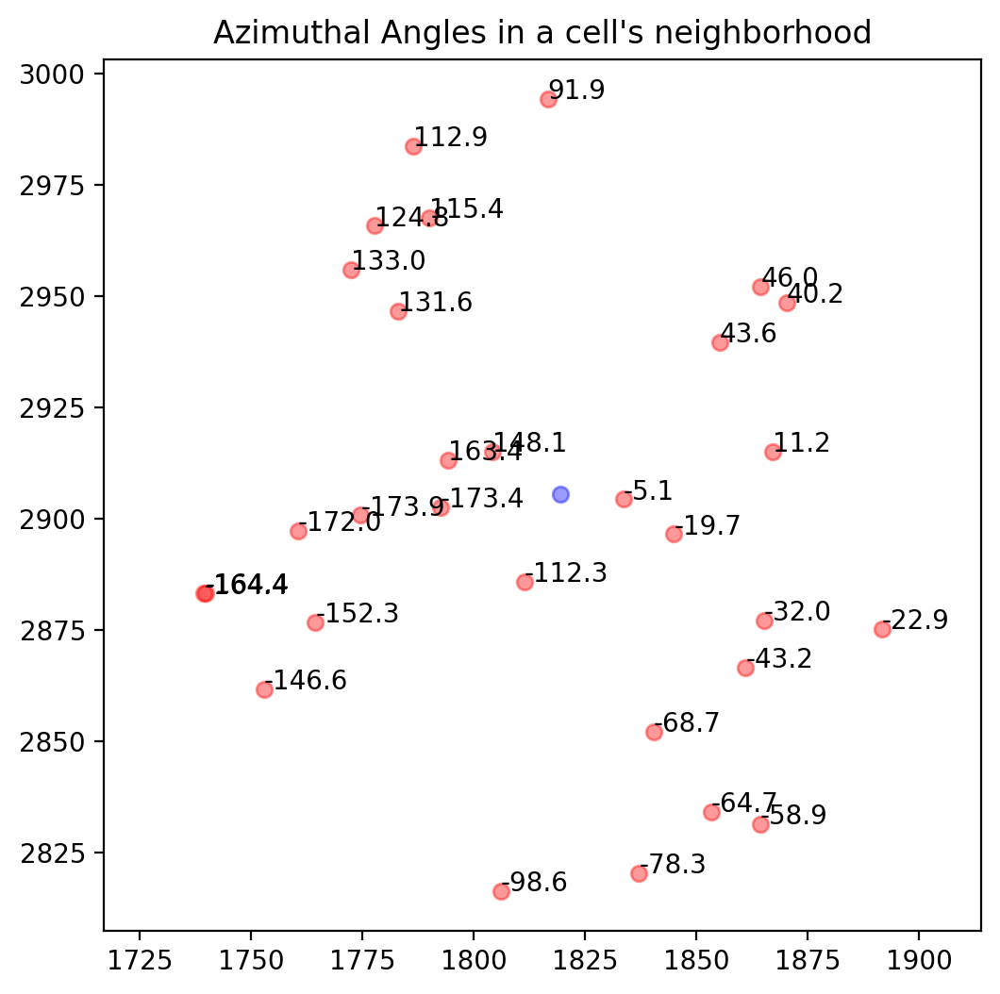

In [19]:
from banksy.initialize_banksy import initialize_banksy

banksy_dict = initialize_banksy(
    adata,
    ('x', 'y', 'spatial'),
    k_geom,
    nbr_weight_decay=nbr_weight_decay,
    max_m=max_m,
    plt_edge_hist=True,
    plt_nbr_weights=True,
    plt_agf_angles=False, # takes long time to plot
    plt_theta=True,
)

In [20]:
from banksy.embed_banksy import generate_banksy_matrix

# The following are the main hyperparameters for BANKSY
# -----------------------------------------------------
resolutions = [0.9]  # clustering resolution for UMAP
pca_dims = [50]  # Dimensionality in which PCA reduces to
lambda_list = [0.2]  # list of lambda parameters

banksy_dict, banksy_matrix = generate_banksy_matrix(adata,
                                                    banksy_dict,
                                                    lambda_list,
                                                    max_m)
banksy_matrix

Runtime Jun-17-2025-12-27

25066 genes to be analysed:
Gene List:
Index(['OR4F5', 'AL627309.1', 'AL627309.5', 'AL627309.4', 'AL669831.2',
       'LINC01409', 'FAM87B', 'LINC01128', 'LINC00115', 'FAM41C',
       ...
       'BX004987.1', 'MAFIP', 'AC011043.1', 'AL354822.1', 'AL592183.1',
       'AC240274.1', 'AC004556.3', 'AC233755.2', 'AC233755.1', 'AC007325.4'],
      dtype='object', length=25066)

Decay Type: scaled_gaussian
Weights Object: {'weights': {0: <4804x4804 sparse matrix of type '<class 'numpy.float64'>'
	with 72060 stored elements in Compressed Sparse Row format>, 1: <4804x4804 sparse matrix of type '<class 'numpy.complex128'>'
	with 144120 stored elements in Compressed Sparse Row format>}}

Nbr matrix | Mean: 0.11 | Std: 0.24
Size of Nbr | Shape: (4804, 25066)
Top 3 entries of Nbr Mat:

[[0.         0.         0.        ]
 [0.         0.         0.        ]
 [0.         0.         0.08987902]]

AGF matrix | Mean: 0.04 | Std: 0.07
Size of AGF mat (m = 1) | Shape: (4804, 250

/Users/koush/Projects/Banksy_py/banksy/main.py:302: RuntimeWarning: invalid value encountered in divide
  zscored_matrix = (matrix - E_x) / np.sqrt(variance)


Shape of BANKSY matrix: (4804, 75198)
Type of banksy_matrix: <class 'anndata._core.anndata.AnnData'>



AnnData object with n_obs × n_vars = 4804 × 75198
    obs: 'X', 'Y', 'cell_type', 'x', 'y'
    var: 'is_nbr', 'k'

In [21]:
from banksy.main import concatenate_all

banksy_dict["nonspatial"] = {
    # Here we simply append the nonspatial matrix (adata.X) to obtain the nonspatial clustering results
    0.0: {"adata": concatenate_all([adata.X], 0, adata=adata), }
}

print(banksy_dict['nonspatial'][0.0]['adata'])

Scale factors squared: [1.]
Scale factors: [1.]


/Users/koush/Projects/Banksy_py/banksy/main.py:302: RuntimeWarning: invalid value encountered in divide
  zscored_matrix = (matrix - E_x) / np.sqrt(variance)


AnnData object with n_obs × n_vars = 4804 × 25066
    obs: 'X', 'Y', 'cell_type', 'x', 'y'
    var: 'is_nbr', 'k'


In [22]:
from banksy_utils.umap_pca import pca_umap

pca_umap(
    banksy_dict,
    pca_dims = pca_dims,
    add_umap = True,
    plt_remaining_var = False,
)

Current decay types: ['scaled_gaussian', 'nonspatial']

Reducing dims of dataset in (Index = scaled_gaussian, lambda = 0.2)

Setting the total number of PC = 50
Original shape of matrix: (4804, 75198)
Reduced shape of matrix: (4804, 50)
------------------------------------------------------------
min_value = -60.85167685648415, mean = -5.040652879830186e-17, max = 115.73735333404981

Conducting UMAP and adding embeddings to adata.obsm["reduced_pc_50_umap"]


/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


UMAP embedding
------------------------------------------------------------
shape: (4804, 2)


AxisArrays with keys: reduced_pc_50, reduced_pc_50_umap

Reducing dims of dataset in (Index = nonspatial, lambda = 0.0)

Setting the total number of PC = 50
Original shape of matrix: (4804, 25066)
Reduced shape of matrix: (4804, 50)
------------------------------------------------------------
min_value = -114.8969497680664, mean = 4.12914769043482e-09, max = 155.86012268066406

Conducting UMAP and adding embeddings to adata.obsm["reduced_pc_50_umap"]


/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


UMAP embedding
------------------------------------------------------------
shape: (4804, 2)


AxisArrays with keys: reduced_pc_50, reduced_pc_50_umap


In [23]:
from banksy.cluster_methods import run_Leiden_partition

results_df, max_num_labels = run_Leiden_partition(
    banksy_dict,
    resolutions,
    num_nn = 50, # k_expr: number of neighbours in expression (BANKSY embedding or non-spatial) space
    num_iterations = -1, # run to convergenece
    partition_seed = 42,
    match_labels = True,
)

Decay type: scaled_gaussian
Neighbourhood Contribution (Lambda Parameter): 0.2
reduced_pc_50 

reduced_pc_50_umap 

PCA dims to analyse: [50]

Setting up partitioner for (nbr decay = scaled_gaussian), Neighbourhood contribution = 0.2, PCA dimensions = 50)


Nearest-neighbour weighted graph (dtype: float64, shape: (4804, 4804)) has 240200 nonzero entries.
---- Ran find_nn in 0.53 s ----


Nearest-neighbour connectivity graph (dtype: int16, shape: (4804, 4804)) has 240200 nonzero entries.

(after computing shared NN)
Allowing nearest neighbours only reduced the number of shared NN from 4018568 to 239613.


Shared nearest-neighbour (connections only) graph (dtype: int16, shape: (4804, 4804)) has 231094 nonzero entries.

Shared nearest-neighbour (number of shared neighbours as weights) graph (dtype: int16, shape: (4804, 4804)) has 231094 nonzero entries.

sNN graph data:
[19 24 17 ... 26 11 10]

---- Ran shared_nn in 0.12 s ----


-- Multiplying sNN connectivity by weights --


shared NN w

/Users/koush/Projects/Banksy_py/banksy/labels.py:398: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  expand_labels(label_list[sort_indices[0]],
/Users/koush/Projects/Banksy_py/banksy/labels.py:414: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  current_label = label_list[index]


,decay,lambda_param,num_pcs,resolution,num_labels,labels,adata,relabeled
nonspatial_pc50_nc0.00_r0.90,nonspatial,0.0,50,0.9,11,"Label object:\nNumber of labels: 11, number of...",[[[View of AnnData object with n_obs × n_vars ...,"Label object:\nNumber of labels: 11, number of..."
scaled_gaussian_pc50_nc0.20_r0.90,scaled_gaussian,0.2,50,0.9,10,"Label object:\nNumber of labels: 10, number of...",[[[View of AnnData object with n_obs × n_vars ...,"Label object:\nNumber of labels: 10, number of..."


number of labels: 11
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 11
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 11
---- Ran plot_2d_embeddings in 0.00 s ----

---- Ran row_normalize in 0.00 s ----


matrix multiplying labels x weights x labels-transpose ((11, 4804) x (4804, 4804) x (4804, 11))

number of labels: 10
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 10
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 10
---- Ran plot_2d_embeddings in 0.00 s ----

---- Ran row_normalize in 0.00 s ----


matrix multiplying labels x weights x labels-transpose ((10, 4804) x (4804, 4804) x (4804, 10))



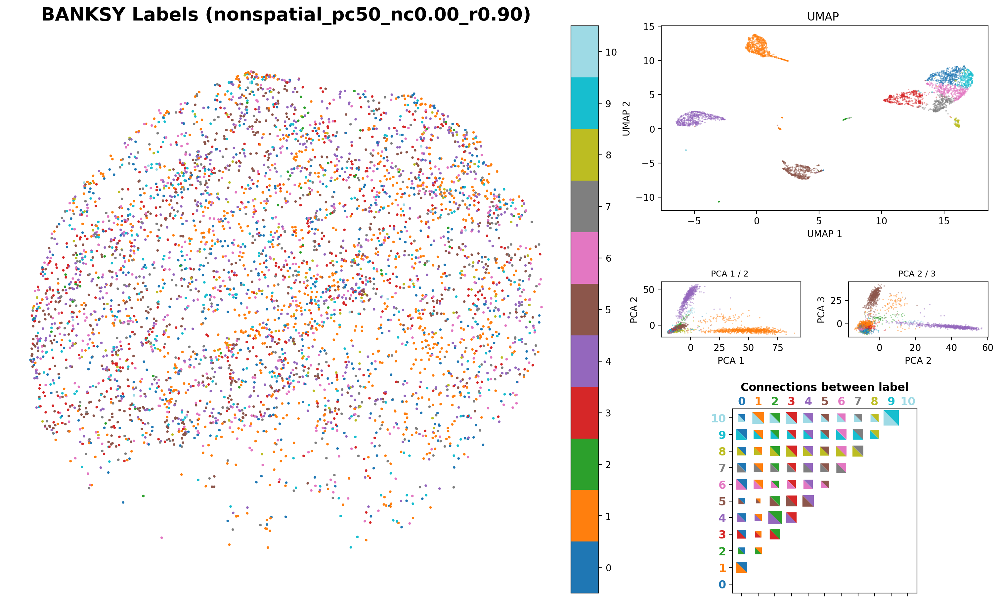

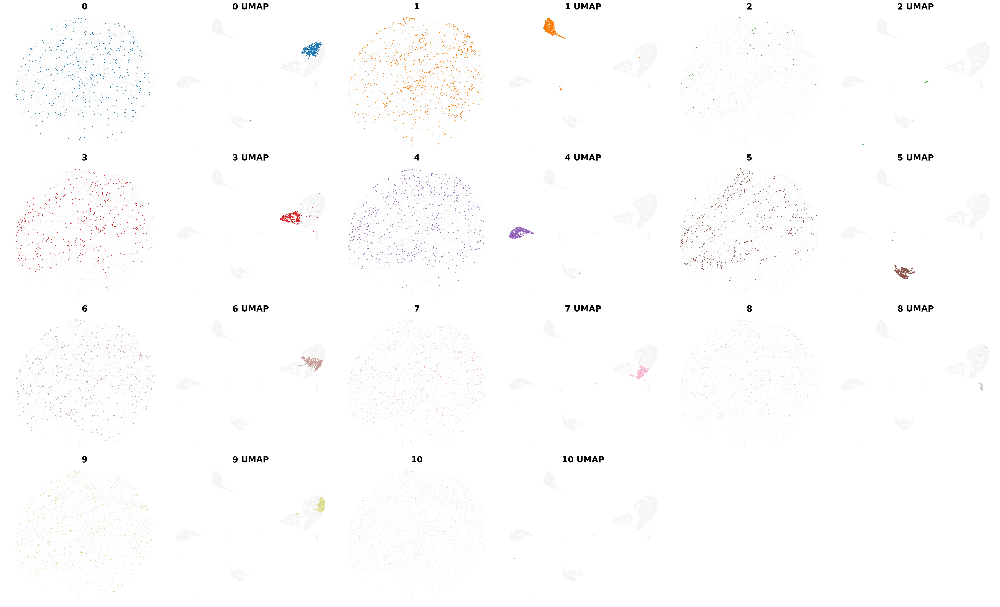

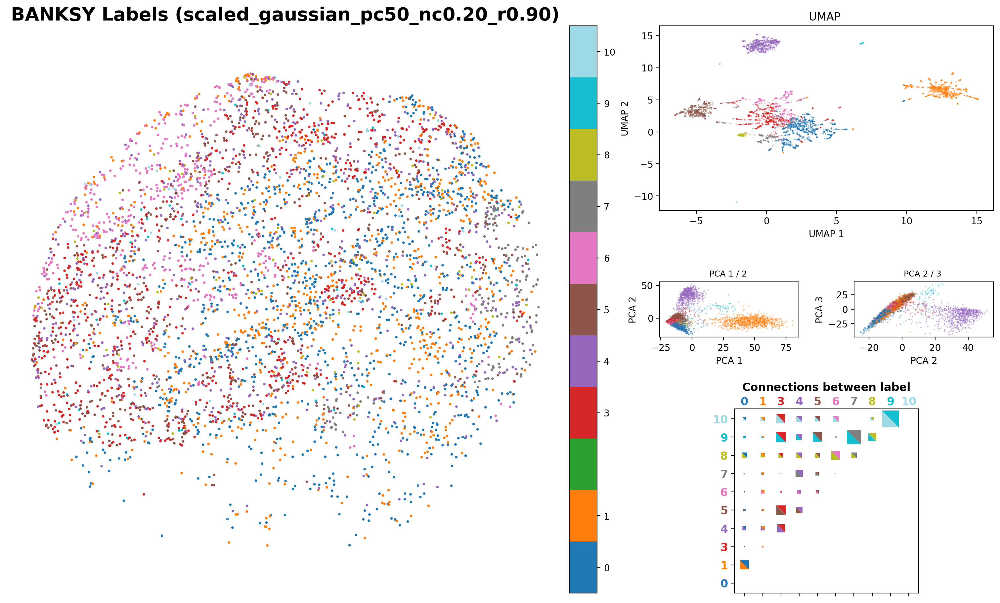

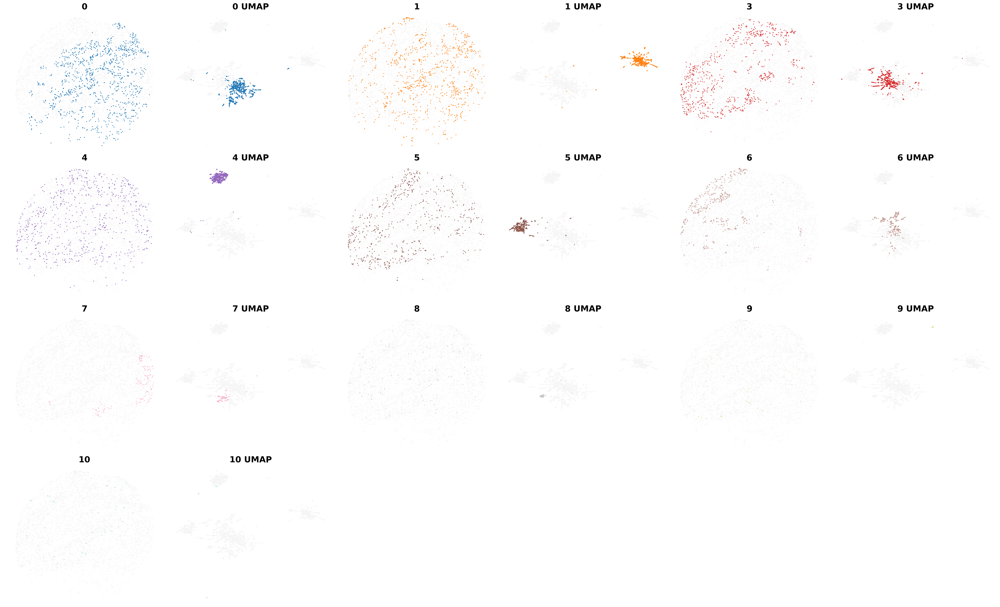

In [24]:
from banksy.plot_banksy import plot_results

c_map =  'tab20' # specify color map
weights_graph =  banksy_dict['scaled_gaussian']['weights'][0]

plot_results(
    results_df,
    weights_graph,
    c_map,
    match_labels = True,
    coord_keys = ('x', 'y', 'spatial'),
    max_num_labels  =  max_num_labels, 
    save_path = '/tmp',
    save_fig = False
)

In [77]:
results_df.iloc[0].adata.obs

,cell_type,cell_type_int,x,y,banksy_cluster,labels_scaled_gaussian_pc50_nc0.20_r1.50
NAME,,,,,,
AAACCCAAGCGCCTTG-1,T_CD4,5,1733.213235,1665.039824,1,0
AAACCCAAGTGGACGT-1,plasma,12,519.377858,2220.266321,5,8
AAACCCACAGAAGTGC-1,B_germinal_center,0,1064.296595,2158.266703,3,2
AAACCCAGTCATTGCA-1,B_naive,2,1740.127314,3218.472808,1,1
AAACCCATCATCGCAA-1,B_memory,1,930.600158,2892.947737,0,1
...,...,...,...,...,...,...
TTTGTTGCAGGGACTA-1,B_germinal_center,0,1699.607471,1920.402412,3,3
TTTGTTGCATTGTAGC-1,plasma,12,688.211974,2794.005768,5,8
TTTGTTGGTACCACGC-1,B_germinal_center,0,1258.258885,2713.702000,3,3


In [78]:
label = 'labels_scaled_gaussian_pc50_nc0.20_r1.50'

In [79]:
adata.obs['banksy_cluster'] = results_df.iloc[0].adata.obs.loc[adata.obs_names][label].copy()

In [59]:
adata.obs

,cell_type,cell_type_int,x,y,banksy_cluster
NAME,,,,,
AAACCCAAGCGCCTTG-1,T_CD4,5,1733.213235,1665.039824,1
AAACCCAAGTGGACGT-1,plasma,12,519.377858,2220.266321,5
AAACCCACAGAAGTGC-1,B_germinal_center,0,1064.296595,2158.266703,3
AAACCCAGTCATTGCA-1,B_naive,2,1740.127314,3218.472808,1
AAACCCATCATCGCAA-1,B_memory,1,930.600158,2892.947737,0
...,...,...,...,...,...
TTTGTTGCAGGGACTA-1,B_germinal_center,0,1699.607471,1920.402412,3
TTTGTTGCATTGTAGC-1,plasma,12,688.211974,2794.005768,5
TTTGTTGGTACCACGC-1,B_germinal_center,0,1258.258885,2713.702000,3


In [90]:
adata.obs.cell_type.value_counts()

cell_type
B_germinal_center      1848
B_naive                1067
T_CD4                   779
B_memory                516
T_follicular_helper     294
plasma                  262
FDC                     255
T_CD8                   238
NK                      170
mDC                     137
myeloid                 102
pDC                      64
T_double_neg             46
Name: count, dtype: int64

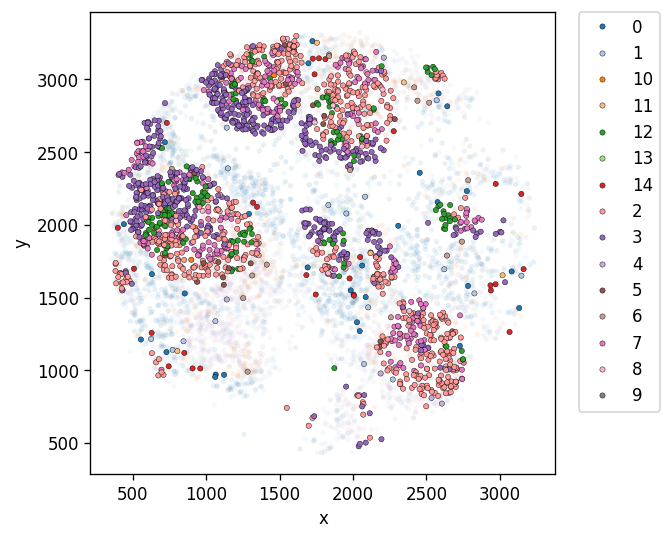

In [126]:
plt.rcParams['figure.figsize'] = (5, 5)
plt.rcParams['figure.dpi'] = 120
label = 'labels_scaled_gaussian_pc50_nc0.20_r0.90'
sns.scatterplot(
    data=adata.obs, 
    x='x', y='y', hue='banksy_cluster', s=10, 
    legend=False, palette='tab20', alpha=0.1)

sns.scatterplot(
    data=adata.obs[adata.obs.cell_type.isin(['B_germinal_center'])], 
    x='x', y='y', hue='banksy_cluster', s=10, linewidth=0.25, edgecolor='black',
    legend=True, palette='tab20')

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

In [81]:
from scipy.stats import chi2_contingency
import numpy as np

In [84]:
# Calculate contingency table and chi-square test for correlation between categorical variables
contingency_table = pd.crosstab(adata.obs['cell_type'], adata.obs['banksy_cluster'])
chi2, p_value = chi2_contingency(contingency_table)[:2]

print("Chi-square test results:")
print(f"Chi-square statistic: {chi2:.2f}")
print(f"p-value: {p_value:.2e}")

# Calculate Cramer's V correlation coefficient
n = contingency_table.sum().sum()
min_dim = min(contingency_table.shape) - 1
cramer_v = np.sqrt(chi2 / (n * min_dim))

Chi-square test results:
Chi-square statistic: 37808.61
p-value: 0.00e+00


In [85]:
contingency_table

banksy_cluster,0,1,10,11,12,13,14,2,3,4,5,6,7,8,9
cell_type,,,,,,,,,,,,,,,
B_germinal_center,28,16,5,6,172,0,28,689,558,5,24,16,280,21,0
B_memory,6,362,0,0,1,0,0,3,1,71,0,71,1,0,0
B_naive,23,510,0,1,0,0,0,2,1,311,3,216,0,0,0
FDC,4,4,215,1,1,1,0,2,0,4,3,2,0,2,16
NK,148,2,0,5,0,0,0,1,0,1,13,0,0,0,0
T_CD4,744,3,0,6,0,0,0,0,0,0,22,4,0,0,0
T_CD8,52,6,0,178,0,0,0,0,0,0,0,2,0,0,0
T_double_neg,45,0,0,0,0,0,0,0,0,0,0,1,0,0,0
T_follicular_helper,25,0,0,0,0,0,0,0,0,0,268,1,0,0,0


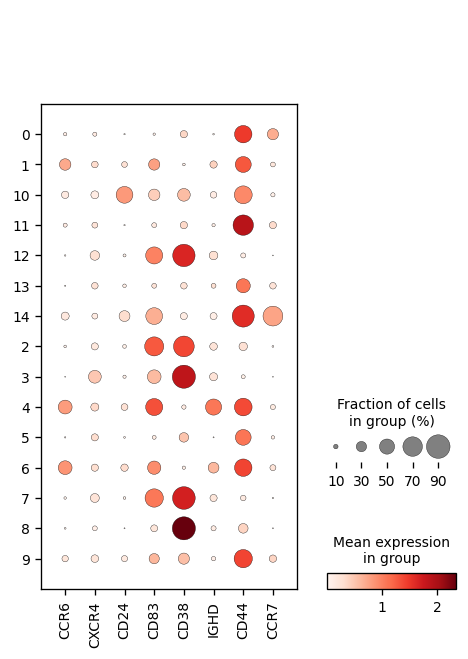

In [116]:
# Get B memory vs B naive cells
b_cells = adata.obs[adata.obs.cell_type.isin(['B_memory', 'B_naive'])]

# Plot marker gene expression
marker_genes = ['CCR6', 'CXCR4','CD24', 'CD83',
    'CD38', 'IGHD', 'CD44', 'CCR7']  # Key marker genes distinguishing memory vs naive B cells

sc.pl.dotplot(adata, marker_genes, groupby='banksy_cluster', dendrogram=False)


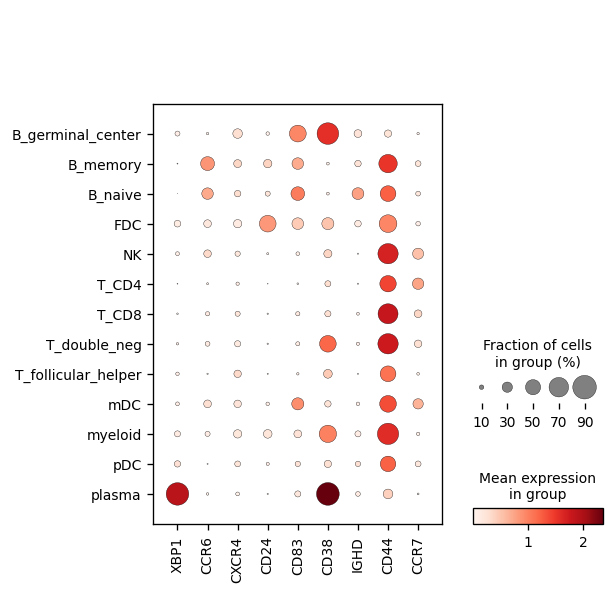

In [124]:
# Get B memory vs B naive cells
b_cells = adata.obs[adata.obs.cell_type.isin(['B_memory', 'B_naive'])]

# Plot marker gene expression
marker_genes = ['XBP1', 'CCR6', 'CXCR4','CD24', 'CD83',
    'CD38', 'IGHD', 'CD44', 'CCR7']  # Key marker genes distinguishing memory vs naive B cells

sc.pl.dotplot(adata, marker_genes, groupby='cell_type', dendrogram=False)


In [128]:
banksy2ct = {
    0: 'T_CD4',
    1: 'B_memory',
    2: 'GC Light Zone',
    3: 'GC Dark Zone',
    4: 'B_naive',
    5: 'T_follicular_helper',
    6: 'B_naive',
    7: 'GC Intermediate Zone',
    8: 'plasma',
    9: 'mDC/myeloid',
    10: 'FDC',
    11: 'T_CD8',
    12: 'GC Intermediate Zone',
    13: 'pDC',
    14: 'GC Light Zone', 
}

In [134]:
adata.obs['banksy_celltypes'] = adata.obs['banksy_cluster'].astype(int).map(banksy2ct)
adata.obs['banksy_celltypes']  = adata.obs['banksy_celltypes'].astype('category')

In [141]:
adata.obs['banksy_celltypes'].unique()

['T_CD4', 'plasma', 'GC Light Zone', 'B_memory', 'GC Intermediate Zone', ..., 'FDC', 'B_naive', 'T_CD8', 'mDC/myeloid', 'pDC']
Length: 12
Categories (12, object): ['B_memory', 'B_naive', 'FDC', 'GC Dark Zone', ..., 'T_follicular_helper', 'mDC/myeloid', 'pDC', 'plasma']

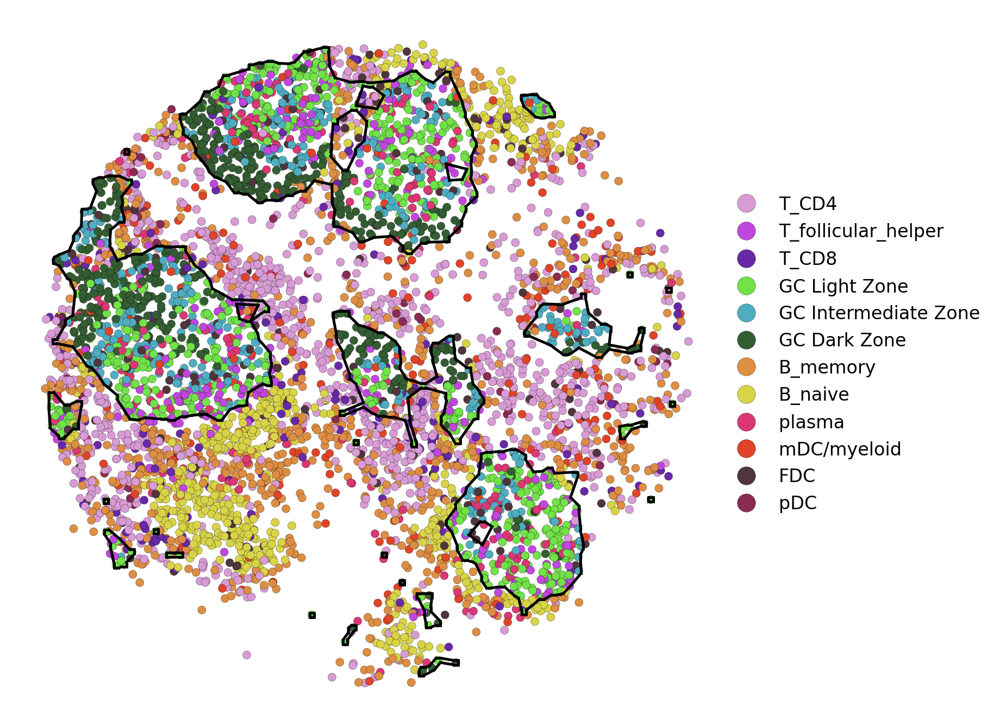

In [216]:
plt.rcParams['figure.figsize'] = (9.25, 9)
plt.rcParams['figure.dpi'] = 120
label = 'labels_scaled_gaussian_pc50_nc0.20_r0.90'

color_dict = {
    'T_CD4': "#d89bd5",
    'T_follicular_helper': "#c047dd", 
    'T_CD8': "#6729a7",
    'GC Light Zone': "#71e248",
    'GC Intermediate Zone': "#4fadc1",
    'GC Dark Zone': "#345d33",
    'B_memory': "#dd8e43",
    'B_naive': "#d9d447", 
    'plasma': "#db3774",
    'mDC/myeloid': "#e04327",
    'FDC': "#50363c",
    'pDC': "#8a2b52"
}
f, ax = plt.subplots(1, 1, figsize=(7, 7), dpi=120)



points = np.asarray(
    adata[adata.obs['banksy_celltypes'].str.contains('GC')].obsm['spatial'])
delta = 10
points = np.vstack(
    (points +[-delta,delta], points +[-delta,-delta], points +[delta,delta], points +[delta,-delta]))

edges = alpha_shape(points, alpha=50, only_outer=True)

for ii, jj in edges:
    ax.plot(points[[ii, jj], 0], points[[ii, jj], 1], 'k', linewidth=1.5)
    
g = sns.scatterplot(
    data=adata.obs, ax=ax,
    x='x', y='y', hue='banksy_celltypes', s=20,
    legend=True, palette=color_dict, alpha=1,
    edgecolor='black', linewidth=0.1, 
    # style='banksy_celltypes'
)


handles, labels = g.get_legend_handles_labels()
label_handle_map = dict(zip(labels, handles))
ordered_handles = [label_handle_map[key] for key in color_dict.keys()]
plt.legend(handles=ordered_handles, labels=color_dict.keys(), 
          bbox_to_anchor=(1, 0.75), loc='upper left',
          borderaxespad=0., frameon=False, fontsize=10, markerscale=2.25)

    
plt.gca().set_frame_on(False)
plt.xticks([])
plt.yticks([])
plt.xlabel('')
plt.ylabel('')
plt.show()

In [279]:
adata.obs[['banksy_celltypes']].to_csv('/tmp/banksy_celltypes.csv')

In [232]:
sc.pp.neighbors(adata, use_rep='X')

In [256]:
sc.tl.umap(adata, min_dist=0.5, spread=1)

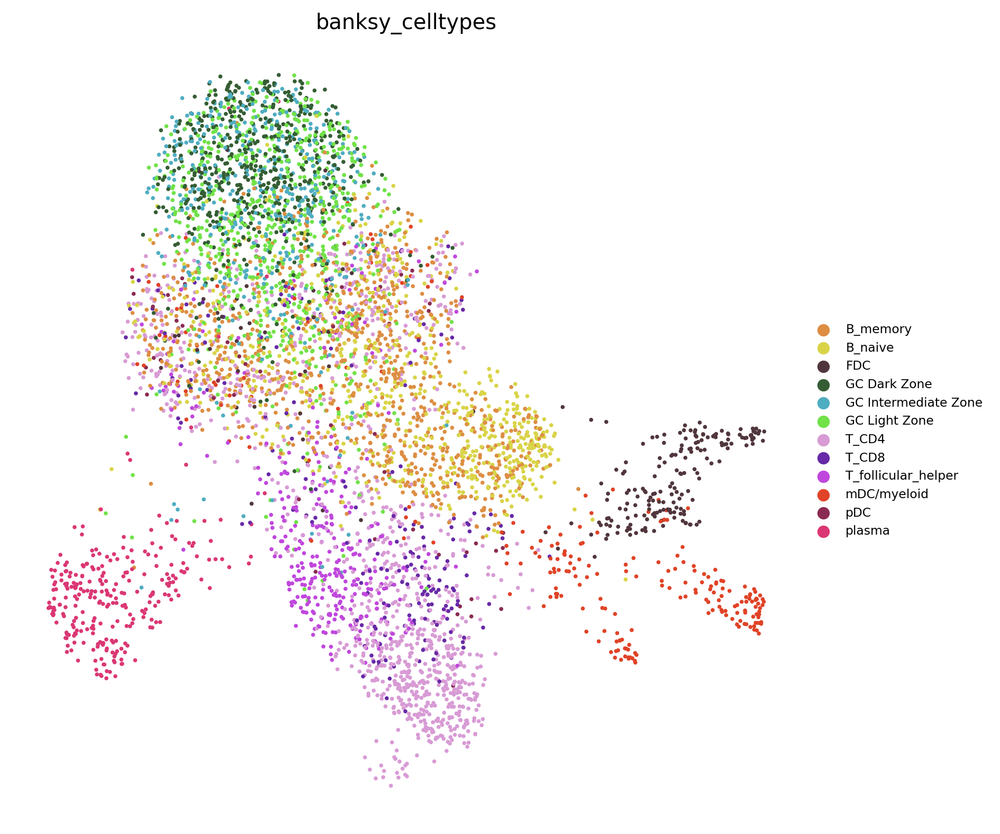

In [276]:
plt.rcParams['figure.figsize'] = (8, 8)
ax = sc.pl.umap(adata, color='banksy_celltypes', 
    legend_fontsize=7, palette=color_dict, frameon=False,
    show=False)